# Canova fingerprints

In [1]:
import os
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

from PIL import Image

import tensorflow as tf
from tensorflow import keras
from keras import layers 

In [2]:
images_path = '../data/raw/images/'

mc_conv = tf.keras.utils.load_img(images_path + 'MCconv.jpg')
mc_raw = tf.keras.utils.load_img(images_path + 'MC_P2.jpg')
mc_inv_raw = tf.keras.utils.load_img(images_path + 'MC_P2inv.jpg')

sg_conv = tf.keras.utils.load_img(images_path + 'SGconv.jpg')
sg_raw = tf.keras.utils.load_img(images_path + 'SG_P2.jpg')
sg_inv_raw = tf.keras.utils.load_img(images_path + 'SG_P2_inv.jpg')

os.makedirs('../figures', exist_ok=True)

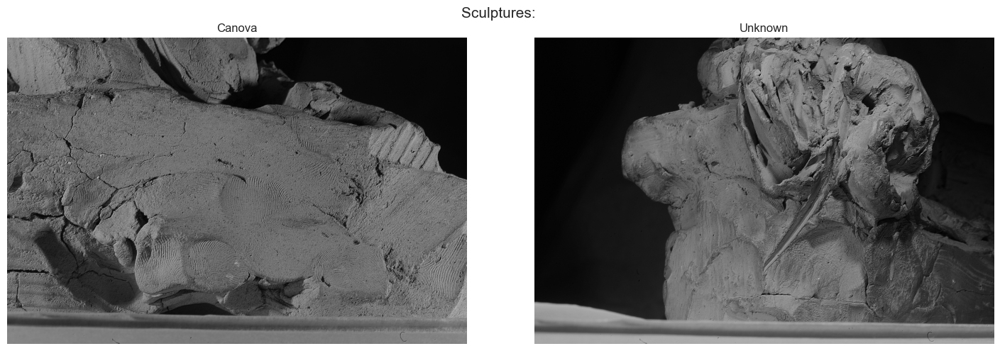

In [3]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Sculptures: ', fontsize=15)

axs[0].imshow(mc_conv)
axs[0].set_title('Canova')
axs[0].axis('off')

axs[1].imshow(sg_conv)
axs[1].set_title('Unknown')
axs[1].axis('off')

#plt.axis('off')
plt.tight_layout()
plt.savefig('../figures/sculptures.jpg')

In [4]:
mc_conv_arr = tf.keras.utils.img_to_array(mc_conv)
sg_conv_arr = tf.keras.utils.img_to_array(sg_conv)
print(f'Shapes for sculpture images: {mc_conv_arr.shape}, {sg_conv_arr.shape}')

ratio = mc_conv_arr.shape[1]/mc_conv_arr.shape[0]
print(f'L/W ratio: {ratio:4f}')

Shapes for sculpture images: (4912, 7360, 3), (4912, 7360, 3)
L/W ratio: 1.498371


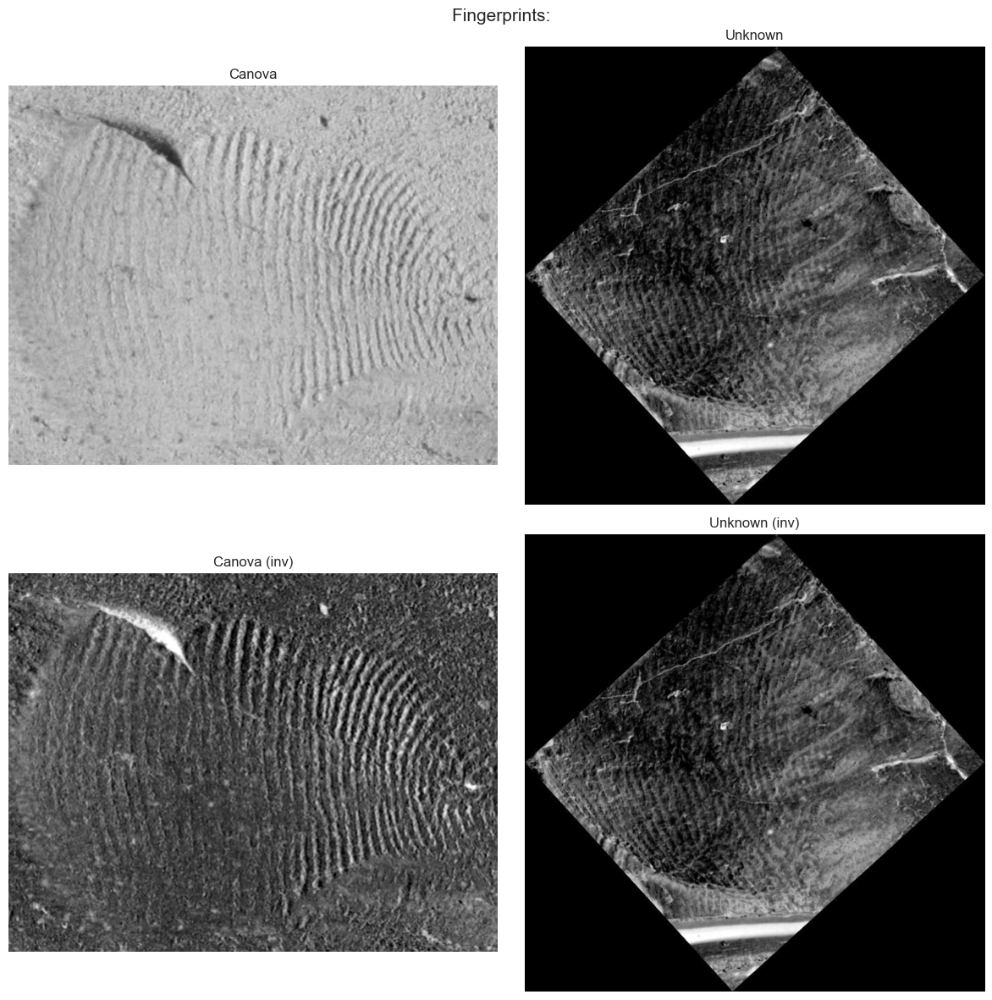

In [5]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle('Fingerprints: ', fontsize=15)

axs[0, 0].imshow(mc_raw)
axs[0, 0].set_title('Canova')
axs[0, 0].axis('off')

axs[1, 0].imshow(mc_inv_raw)
axs[1, 0].set_title('Canova (inv)')
axs[1, 0].axis('off')

axs[0, 1].imshow(sg_raw)
axs[0, 1].set_title('Unknown')
axs[0, 1].axis('off')

axs[1, 1].imshow(sg_inv_raw)
axs[1, 1].set_title('Unknown (inv)')
axs[1, 1].axis('off')

plt.tight_layout()
plt.savefig('../figures/fingerprints.jpg')

In [6]:
mc = tf.keras.utils.img_to_array(mc_raw)
mc_inv = tf.keras.utils.img_to_array(mc_inv_raw)

sg = tf.keras.utils.img_to_array(sg_raw)
sg_inv = tf.keras.utils.img_to_array(sg_inv_raw)
print(f'Shapes for fingerprints images: {mc.shape}, {sg.shape}')

ratio1 = mc.shape[1]/mc.shape[0]
ratio2 = sg.shape[1]/sg.shape[0]
print(f'L/W ratios : {ratio1:4f}, {ratio2:4f}')

print(f'Value range: {np.min(mc), np.max(mc)}, {np.min(sg), np.max(sg)}')

Shapes for fingerprints images: (463, 597, 3), (749, 753, 3)
L/W ratios : 1.289417, 1.005340
Value range: (39.0, 243.0), (0.0, 255.0)


In [7]:
# scale values
mc /= 255
sg /= 255
print(f'Value range: {np.min(mc), np.max(mc)}, {np.min(sg), np.max(sg)}')

Value range: (0.15294118, 0.9529412), (0.0, 1.0)


In [8]:
# rotate and get greyscale versions
mc = np.rot90(mc, k=3)
sg = np.rot90(sg, k=3)

mc_g = np.array(tf.image.rgb_to_grayscale(mc))
sg_g = np.array(tf.image.rgb_to_grayscale(sg))

print(f'Shapes for fingerprints images: {mc_g.shape}, {sg_g.shape}')

Shapes for fingerprints images: (597, 463, 1), (753, 749, 1)


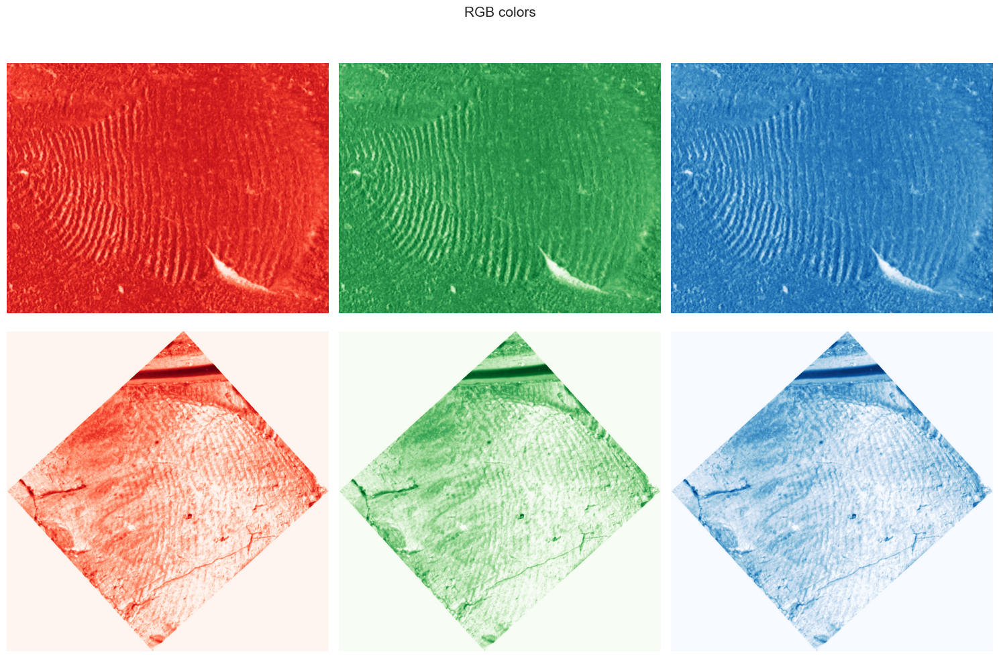

In [9]:
# plot rgb channels
fig = plt.figure(figsize = (15, 10))
fig.suptitle('RGB colors', fontsize = 15)

colors = ['Reds', 'Greens', 'Blues']
for i in range(3):
    ax = fig.add_subplot(2, 3, i+1)
    ax.imshow(np.rot90(mc[:,:,i], k=3), cmap=colors[i])
    ax.axis('off')

    ax = fig.add_subplot(2, 3, i+4)
    ax.imshow(np.rot90(sg[:,:,i], k=3), cmap=colors[i])
    ax.axis('off')

fig.tight_layout()
plt.savefig('../figures/fingerprints_rgb.jpg')

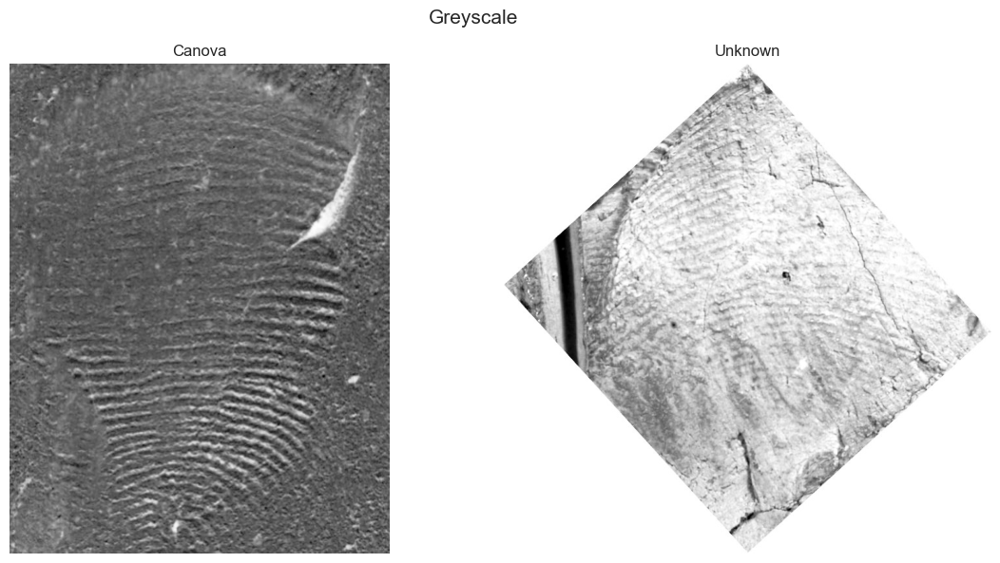

In [10]:
# plot greyscale
fig, axs = plt.subplots(1, 2, figsize = (12, 6))
fig.suptitle('Greyscale', fontsize = 15)

for ax, im, tit in zip(axs.flat, [mc_g, sg_g], ['Canova', 'Unknown']):
    ax.imshow(im, cmap='Greys')
    ax.set_title(tit)
    ax.axis('off')

fig.tight_layout()
plt.savefig('../figures/fingerprints_grey.jpg')

## Play with image parameters (brightness, contrast, saturation)

### Canova fingerprint

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


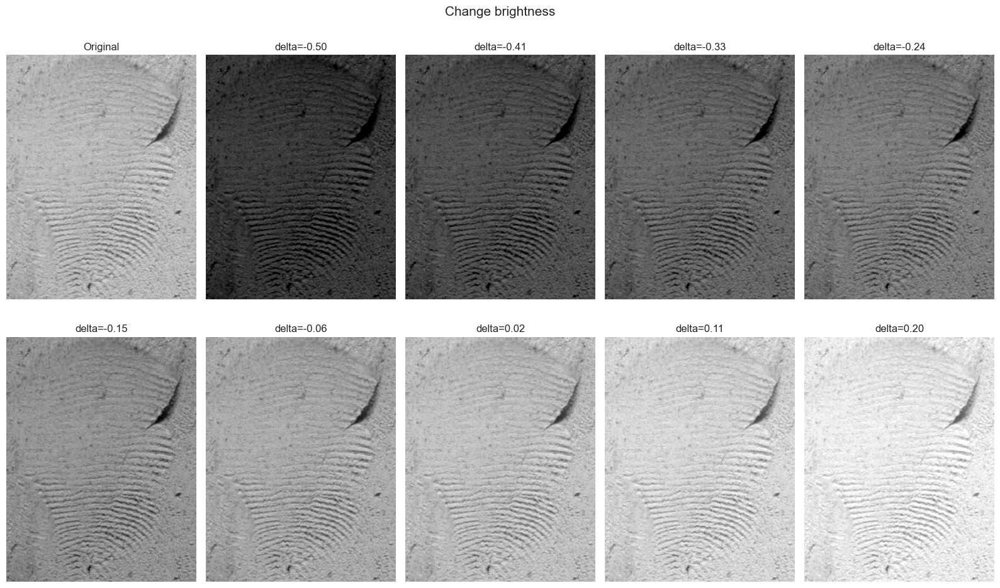

In [11]:
# change brightness
fig = plt.figure(figsize = (16, 10))
fig.suptitle('Change brightness', fontsize = 15)

deltas = np.linspace(-0.5, 0.2, 9)
deltas = np.insert(deltas, 0, 0)
for i, d in enumerate(deltas):
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(tf.image.adjust_brightness(mc, d))
    ax.axis('off')
    tit = 'Original' if d==0 else f'delta={d:.2f}'
    ax.set_title(tit)

fig.tight_layout()
plt.savefig('../figures/canova_brightness.jpg')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


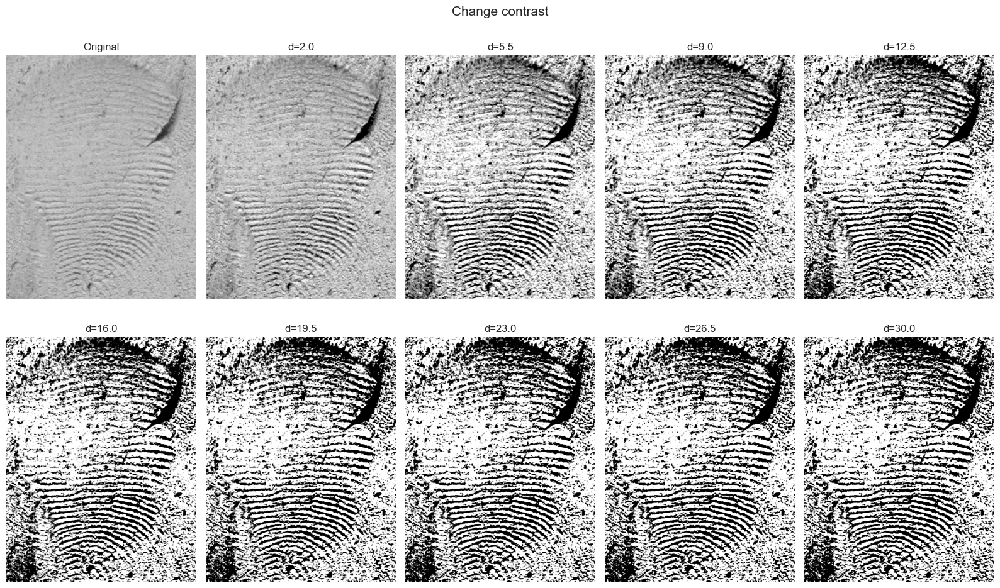

In [21]:
# change contrast
fig = plt.figure(figsize = (16, 10))
fig.suptitle('Change contrast', fontsize = 15)

deltas = np.linspace(2, 30, 9)
deltas = np.insert(deltas, 0, 1)
for i, d in enumerate(deltas):
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(tf.image.adjust_contrast(mc, d))
    ax.axis('off')
    tit = 'Original' if d==1 else f'd={d}'
    ax.set_title(tit)

fig.tight_layout()
plt.savefig('../figures/canova_contrast.jpg')

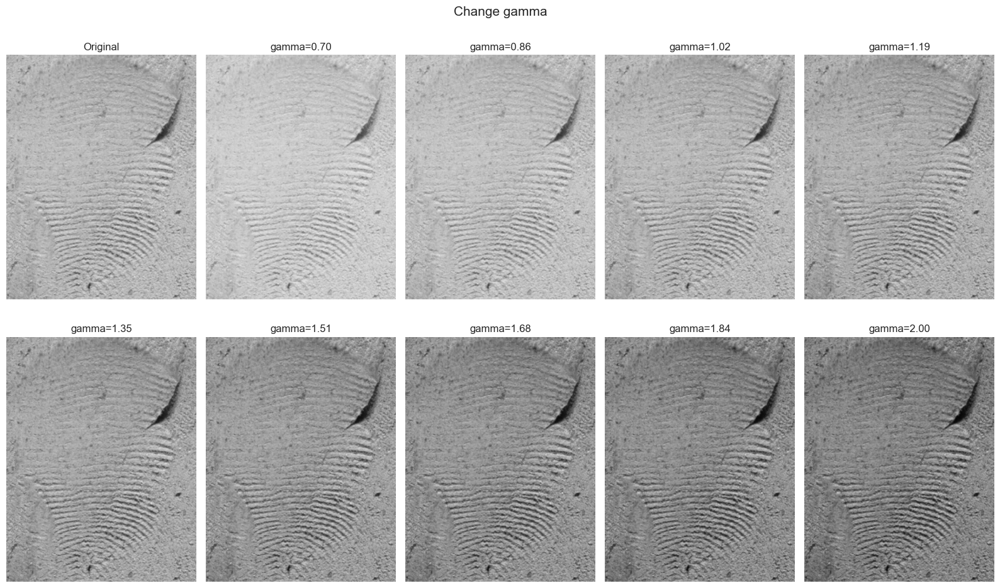

In [13]:
# change gamma
fig = plt.figure(figsize = (16, 10))
fig.suptitle('Change gamma', fontsize = 15)

deltas = np.linspace(0.7, 2, 9)
deltas = np.insert(deltas, 0, 1)
for i, d in enumerate(deltas):
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(tf.image.adjust_gamma(mc, gamma=d))
    ax.axis('off')
    tit = 'Original' if d==1 else f'gamma={d:.2f}'
    ax.set_title(tit)

fig.tight_layout()
plt.savefig('../figures/canova_saturation.jpg')

### Unknown fingerprint

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


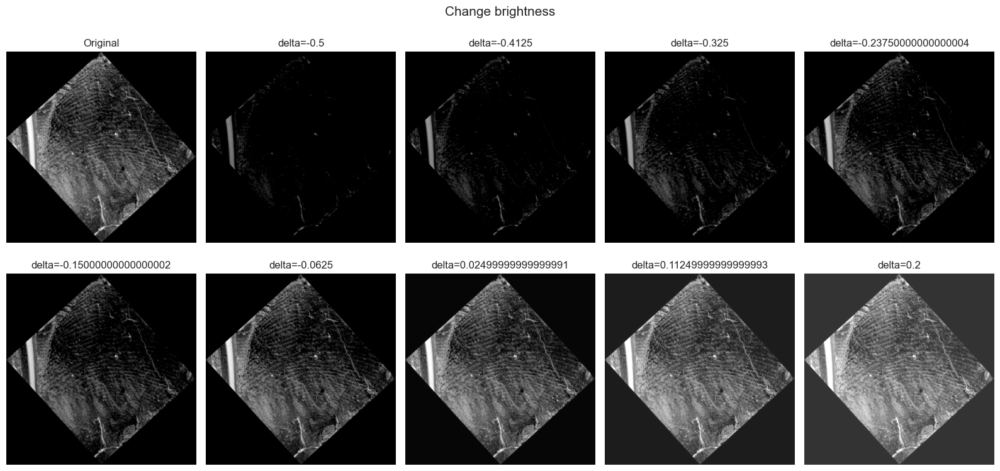

In [14]:
# change brightness
fig = plt.figure(figsize = (16, 8))
fig.suptitle('Change brightness', fontsize = 15)

deltas = np.linspace(-0.5, 0.2, 9)
deltas = np.insert(deltas, 0, 0)
for i, d in enumerate(deltas):
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(tf.image.adjust_brightness(sg, d))
    ax.axis('off')
    tit = 'Original' if d==0 else f'delta={d}'
    ax.set_title(tit)

fig.tight_layout()
plt.savefig('../figures/unknown_brightness.jpg')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


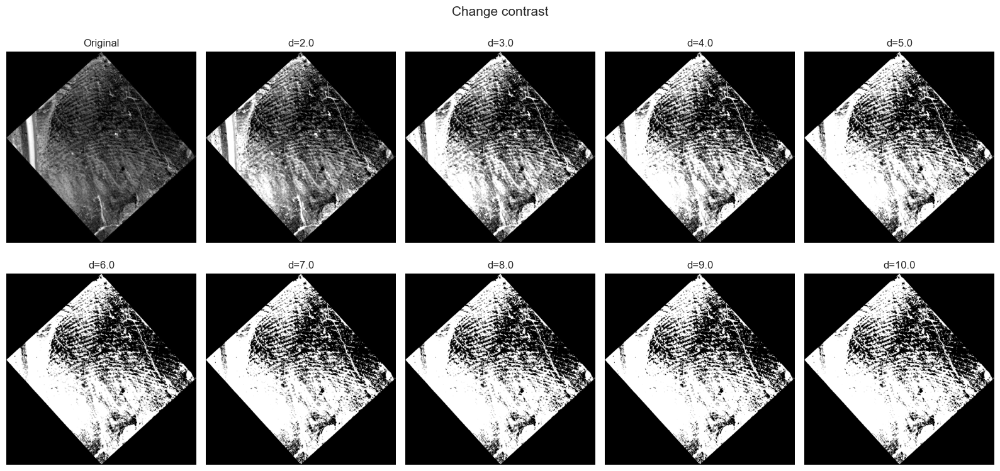

In [15]:
# change contrast
fig = plt.figure(figsize = (16, 8))
fig.suptitle('Change contrast', fontsize = 15)

deltas = np.linspace(2, 10, 9)
deltas = np.insert(deltas, 0, 1)
for i, d in enumerate(deltas):
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(tf.image.adjust_contrast(sg, d))
    ax.axis('off')
    tit = 'Original' if d==1 else f'd={d}'
    ax.set_title(tit)

fig.tight_layout()
plt.savefig('../figures/unknown_contrast.jpg')

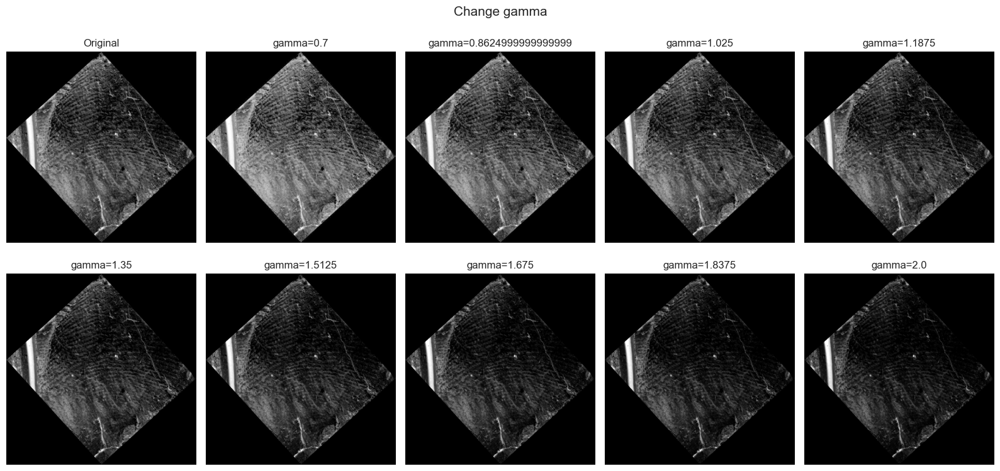

In [16]:
# change gamma
fig = plt.figure(figsize = (16, 8))
fig.suptitle('Change gamma', fontsize = 15)

deltas = np.linspace(0.7, 2, 9)
deltas = np.insert(deltas, 0, 1)
for i, d in enumerate(deltas):
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(tf.image.adjust_gamma(sg, gamma=d))
    ax.axis('off')
    tit = 'Original' if d==1 else f'gamma={d}'
    ax.set_title(tit)

fig.tight_layout()
plt.savefig('../figures/unknown_saturation.jpg')

In [17]:
mc_g.shape, sg_g.shape

((597, 463, 1), (753, 749, 1))

In [22]:
# adjust images
temp = tf.image.adjust_brightness(mc, -0.1)
temp = tf.image.adjust_contrast(temp, 20)
temp = tf.image.adjust_gamma(temp, 1.8)
mc2 = temp

temp = tf.image.adjust_brightness(sg, 0.05)
temp = tf.image.adjust_contrast(temp, 6)
temp = tf.image.adjust_gamma(temp, 0.7)
sg2 = temp

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


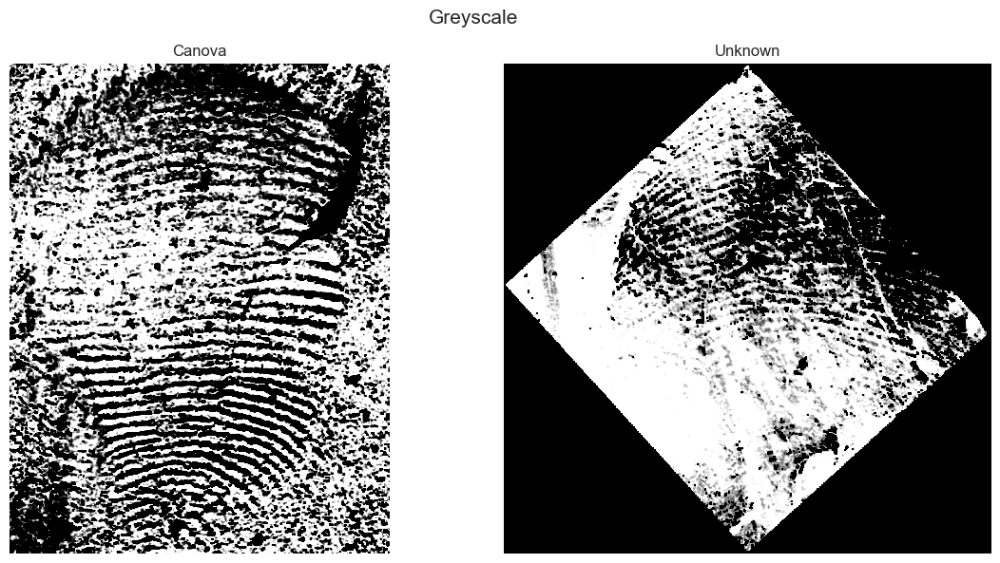

In [23]:
# plot results
fig, axs = plt.subplots(1, 2, figsize = (12, 6))
fig.suptitle('Greyscale', fontsize = 15)

for ax, im, tit in zip(axs.flat, [mc2, sg2], ['Canova', 'Unknown']):
    ax.imshow(im, cmap='Greys')
    ax.set_title(tit)
    ax.axis('off')

fig.tight_layout()
plt.savefig('../figures/fingerprints_grey.jpg')